In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from datetime import timedelta

In [4]:
df1 = pd.read_csv('../data/data_casal_montserratina/Casal_Montserratina_202201_202206.csv', delimiter=';')
df2 = pd.read_csv('../data/data_casal_montserratina/Casal_Montserratina_202207_202212.csv', delimiter=';')
df3 = pd.read_csv('../data/data_casal_montserratina/Casal_Montserratina_202301_202306.csv', delimiter=';')
df4 = pd.read_csv('../data/data_casal_montserratina/Casal_Montserratina_202307_202312.csv', delimiter=';')
df5 = pd.read_csv('../data/data_casal_montserratina/Casal_Montserratina_202401_202405.csv', delimiter=';')
df = pd.concat([df1, df2, df3, df4, df5], axis=0)
df

,TimeStamp,Valor,Període tarifari,Tipus lectura
0,01/01/2022 00:00,6,6,Real
1,01/01/2022 01:00,6,6,Real
2,01/01/2022 02:00,5,6,Real
3,01/01/2022 03:00,7,6,Real
4,01/01/2022 04:00,7,6,Real
...,...,...,...,...
1363,07/05/2024 19:00,10,4,Real
1364,07/05/2024 20:00,7,4,Real
1365,07/05/2024 21:00,4,4,Real
1366,07/05/2024 22:00,2,5,Real


In [5]:
df = df.rename(columns={'TimeStamp': 'Date', 'Valor':'Demand'})
df = df.drop(columns=["Període tarifari", "Tipus lectura"], axis=1)
df["Date"] = pd.to_datetime(df["Date"], format='%d/%m/%Y %H:%M')
df['Demand'] = df['Demand'].apply(lambda x: 2.0 if x < 2 else x)
df.set_index("Date", inplace=True)

,Demand
Date,
2022-01-01 00:00:00,6
2022-01-01 01:00:00,6
2022-01-01 02:00:00,5
2022-01-01 03:00:00,7
2022-01-01 04:00:00,7
...,...
2024-05-07 19:00:00,10
2024-05-07 20:00:00,7
2024-05-07 21:00:00,4


In [6]:
# Weekly Demand Plot
whole_df_1w = df.resample('1W').mean()
fig = go.Figure()
fig.add_trace(go.Scatter(x=whole_df_1w.index, y=whole_df_1w["Demand"], mode='lines'))
fig.update_layout(
    title = "Weekly Energy Demand",
    xaxis_title = "Date",
    yaxis_title = "Demand (kWh)",
    width = 850,
    height = 400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

In [7]:
import calendar
from plotly.subplots import make_subplots
def plot_monthly_demand(df):
    df = df.copy()
    if not pd.api.types.is_datetime64_any_dtype(df.index):
        df.index = pd.to_datetime(df.index)
    
    groups = df.groupby([df.index.year, df.index.month])
    num_plots = len(groups)
    fig = make_subplots(rows=6, cols=2, subplot_titles=[calendar.month_name[i] for i in range(1, 13)], horizontal_spacing=0.1, vertical_spacing=0.05)
    #colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']
    colors = ['blue', 'orange', 'green']

    for month in range(1, 13):
        row = (month - 1) // 2 + 1
        col = (month - 1) % 2 + 1
        monthly_data = df[df.index.month == month]
        unique_years = monthly_data.index.year.unique()
        for i, year in enumerate(unique_years):
            year_data = monthly_data[monthly_data.index.year == year]
            year_data = year_data.copy()
            year_data.index = year_data.index.map(lambda x: x.replace(year=2022))  # Normalizar el año para superponer curvas
            fig.add_trace(
                go.Scatter(x=year_data.index, y=year_data["Demand"], mode='lines', name=f"{year}",
                           legendgroup=f"{month}", line=dict(color=colors[i % len(colors)]), showlegend=False),
                row=row, col=col
            )
        if month == 1:
            for i, year in enumerate(unique_years):
                fig.add_trace(
                    go.Scatter(x=[None], y=[None], mode='lines', name=f"{year}",
                            legendgroup=f"{month}", line=dict(color=colors[i % len(colors)]), showlegend=True),
                    row=row, col=col
                )
                
        fig.update_xaxes(title_text="Date", row=row, col=col)
        fig.update_yaxes(title_text="Demand (kWh)", row=row, col=col)
    fig.update_layout(
        title = {
            "text": "Monthly Energy Demand",
            'x': 0.5,
            'xanchor': 'center'
        },
        xaxis_title="Date",
        yaxis_title="Demand (kWh)",
        width=1700,
        height=2200,
        margin=dict(l=20, r=20, t=45, b=20)   
    )
    fig.show()
plot_monthly_demand(df)

In [8]:
start_date = df.index.min() + timedelta(days=7)
end_date = start_date + timedelta(days=7)
df_week1 = df.loc[(df.index >= start_date) & (df.index <= end_date)]
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_week1.index, y=df_week1["Demand"], mode='lines'))
fig.update_layout(
    title = "One Week Energy Demand",
    xaxis_title = "Date",
    yaxis_title = "Demand (MWh)",
    width = 850,
    height = 400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

### Missing Values

In [9]:
def checkMissingData(df):
    min_date = df.index.min()
    max_date = df.index.max()

    date_range = pd.date_range(start=min_date, end=max_date, freq='h')
    missing_dates = date_range[~date_range.isin(df.index)]
    print(f"Number of Missing Values: {missing_dates.shape[0]}")
    return None if missing_dates.shape[0] == 0 else missing_dates, date_range
missing_dates, date_range = checkMissingData(df)

Number of Missing Values: 2906


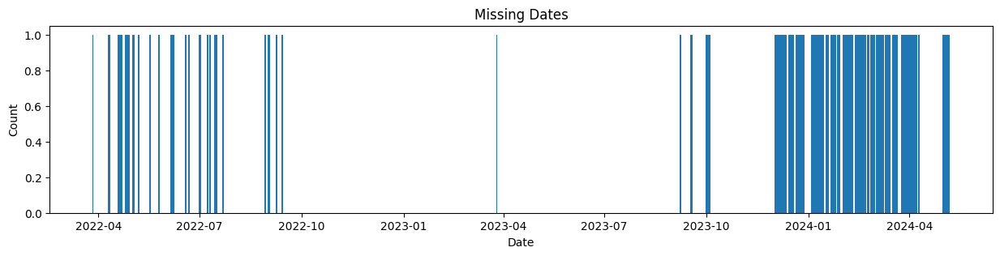

In [10]:
plt.figure(figsize=(15, 3))
plt.bar(missing_dates, [1] * len(missing_dates))
plt.title("Missing Dates")
plt.xlabel("Date")
plt.ylabel("Count")
plt.savefig("../results/missing_values.png")
plt.show()

In [11]:
df = df[~df.index.duplicated(keep='first')]

In [12]:
min_date = df.index.min()
max_date = df.index.max()
date_range = pd.date_range(start=min_date, end=max_date, freq='h')
df = df.reindex(date_range)
print(df)

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df.index,  
    y=df['Demand'], 
    mode='lines', 
    name='Line'  
))
vertical_lines = [
    dict(
        type='line',
        xref='x', yref='paper',
        x0='2022-07-01 00:00:00', x1='2022-07-01 00:00:00',
        y0=0, y1=1,
        line=dict(color='red', width=2)
    ),
    dict(
        type='line',
        xref='x', yref='paper',
        x0='2023-11-01 00:00:00', x1='2023-11-01 00:00:00',
        y0=0, y1=1,
        line=dict(color='red', width=2)
    )
]
# Layout parameters
fig.update_layout(
    title='Demanda Eléctrica Casal La Monserratina',  
    xaxis_title='Fecha', 
    yaxis_title='Consumo [kW]',
    shapes=vertical_lines,  
    xaxis_tickangle=0, 
    showlegend=False     
)

                     Demand
2022-01-01 00:00:00     6.0
2022-01-01 01:00:00     6.0
2022-01-01 02:00:00     5.0
2022-01-01 03:00:00     7.0
2022-01-01 04:00:00     7.0
...                     ...
2024-05-07 19:00:00    10.0
2024-05-07 20:00:00     7.0
2024-05-07 21:00:00     4.0
2024-05-07 22:00:00     2.0
2024-05-07 23:00:00     2.0

[20592 rows x 1 columns]


In [13]:
df = df.loc[(df.index >= pd.to_datetime('2022-01-07 0:00', format='%Y-%d-%m %H:%M'))]
df = df.loc[(df.index <= pd.to_datetime('2023-01-11 0:00', format='%Y-%d-%m %H:%M'))]
print("Nº of NaNs: ", df["Demand"].isna().sum())

df["Demand"].interpolate(method="linear", limit=4, inplace=True)
df.dropna(inplace=True)

Nº of NaNs:  361


C:\Users\afernandez\AppData\Local\Temp\ipykernel_23464\3108481958.py:5: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [14]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df.index,  
    y=df['Demand'], 
    mode='lines', 
    name='Line'  
))

# Layout parameters
fig.update_layout(
    title='Demanda Eléctrico Casal La Monserratina',  
    xaxis_title='Consumo [kW]', 
    yaxis_title='',  
    xaxis_tickangle=0, 
    showlegend=False,     
)

In [15]:
df = df.reset_index()
df.rename(columns={'index': 'Date'}, inplace=True)

In [16]:
# Load the DataFrame from the pickle file
df.set_index("Date", inplace=True)
df = df.resample('15min').interpolate(method='time')
df.reset_index(inplace=True)
df_PV = pd.read_pickle("../data/data_casal_montserratina/LaMonserratina_weather_&_PV_2022_2023.pkl")
df_PV.rename(columns={"timestamp_local": "Date"}, inplace=True)
#df_PV.set_index("Date", inplace=True)
df_PV.head(3)

FileNotFoundError: [Errno 2] No such file or directory: '../data/data_casal_montserratina/LaMonserratina_weather_&_PV_2022_2023.pkl'

In [ ]:
df = df_PV.merge(df, how="inner", on=["Date", "Date"])

df.set_index("Date", inplace=True)

df.reset_index(inplace=True)
df.rename(columns={'Demand': 'Consumo_red [kW]'}, inplace=True)

df["PV [kW]"] = (df["PV"]/1000000).round(3)
df.drop(columns=["PV"], inplace=True)
df["Consumo_total [kW]"] = df["Consumo_red [kW]"] + df["PV [kW]"]
df.drop(columns=["Consumo_red [kW]", "PV [kW]", "PV Wh", "app_temp [C]"], inplace=True)
df.rename(columns={'Consumo_total [kW]': 'Demand'}, inplace=True)
df

,Date,pres [mb],slp [mb],wind_dir [m/s],wind_gust_spd [m/s],wind_spd [m/s],temp [C],rh [%],dewpt [C],clouds [%],...,Temp interna Modulo,Temp interna Modulo [C],Year,Month,Hour,DayOfWeek,DayOfYear,Day,Minute,Demand
0,2022-07-02 00:00:00,1019.0,1020.0,150.00,2.8,1.50,23.100,59.00,14.70,0.0,...,27.667375,27.667375,2022,7,0,5,183,2,0,3.00
1,2022-07-02 00:15:00,1019.0,1020.0,192.50,2.6,1.50,22.825,60.25,14.75,0.0,...,27.543155,27.543155,2022,7,0,5,183,2,15,2.75
2,2022-07-02 00:30:00,1019.0,1020.0,235.00,2.4,1.50,22.550,61.50,14.80,0.0,...,27.418935,27.418935,2022,7,0,5,183,2,30,2.50
3,2022-07-02 00:45:00,1019.0,1020.0,277.50,2.2,1.50,22.275,62.75,14.85,0.0,...,27.294716,27.294716,2022,7,0,5,183,2,45,2.25
4,2022-07-02 01:00:00,1019.0,1020.0,320.00,2.0,1.50,22.000,64.00,14.90,0.0,...,27.170496,27.170496,2022,7,1,5,183,2,0,2.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46748,2023-10-31 23:00:00,1014.0,1015.0,315.00,5.6,3.60,14.200,61.00,6.80,25.0,...,23.647174,23.647174,2023,10,23,1,304,31,0,2.00
46749,2023-10-31 23:15:00,1014.0,1015.0,318.75,5.5,2.95,13.950,62.25,6.85,25.0,...,23.534247,23.534247,2023,10,23,1,304,31,15,2.25
46750,2023-10-31 23:30:00,1014.0,1015.0,322.50,5.4,2.30,13.700,63.50,6.90,25.0,...,23.421320,23.421320,2023,10,23,1,304,31,30,2.50
46751,2023-10-31 23:45:00,1014.0,1015.0,326.25,5.3,1.65,13.450,64.75,6.95,25.0,...,23.308393,23.308393,2023,10,23,1,304,31,45,2.75


In [ ]:
display(df.describe())
'''
df.set_index("Date", inplace=True)
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df.index,  
    y=df['PV [kW]'], 
    mode='lines', 
    name='Line'  
))
df.reset_index(inplace=True)
# Layout parameters
fig.update_layout(
    title='Demanda Eléctrico Casal La Monserratina',  
    xaxis_title='Consumo [kW]', 
    yaxis_title='',  
    xaxis_tickangle=0, 
    showlegend=False,     
)
'''
#Outliers
def getNumberOfOutliersPerColumn(df, columns_list):
    for col in columns_list:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1

        #Calcular los límites inferiores y superiores para identificar outliers
        lim_inf = q1 - 1.5 * iqr
        lim_sup = q3 + 1.5 * iqr

        outliers = ((df[col] < lim_inf) | (df[col] > lim_sup))
        print(f"For {col} Column, the Number of Outliers is {outliers.sum()}\n")


getNumberOfOutliersPerColumn(df, df.columns.drop("Date"))

,Date,pres [mb],slp [mb],wind_dir [m/s],wind_gust_spd [m/s],wind_spd [m/s],temp [C],rh [%],dewpt [C],clouds [%],...,Temp interna Modulo,Temp interna Modulo [C],Year,Month,Hour,DayOfWeek,DayOfYear,Day,Minute,Demand
count,46753,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,...,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000,46753.000000
mean,2023-03-02 11:59:59.999999744,1015.546393,1016.178545,210.974697,5.927489,3.961613,19.660363,69.151595,13.546832,28.159615,...,34.205083,34.205083,2022.624238,7.022672,11.499754,2.999979,198.158343,15.790238,22.499519,6.530468
min,2022-07-02 00:00:00,987.000000,987.000000,10.000000,1.000000,0.000000,-0.500000,14.000000,-13.300000,0.000000,...,17.007066,17.007066,2022.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,2.000000
25%,2022-10-31 18:00:00,1012.250000,1013.000000,120.000000,3.967500,2.600000,14.525000,61.000000,8.875000,15.250000,...,25.589518,25.589518,2022.000000,5.000000,5.000000,1.000000,122.000000,8.000000,0.000000,2.500000
50%,2023-03-02 12:00:00,1015.000000,1016.000000,225.000000,5.300000,3.600000,20.500000,70.750000,14.950000,25.000000,...,29.971086,29.971086,2023.000000,8.000000,11.000000,3.000000,213.000000,16.000000,15.000000,5.798000
75%,2023-07-02 06:00:00,1018.250000,1019.000000,297.500000,7.300000,4.992500,25.300000,79.000000,19.200000,31.000000,...,44.373909,44.373909,2023.000000,10.000000,17.000000,5.000000,274.000000,23.000000,30.000000,7.000000
max,2023-11-01 00:00:00,1038.000000,1038.000000,360.000000,25.700000,8.800000,34.700000,98.000000,26.700000,100.000000,...,53.388000,53.388000,2023.000000,12.000000,23.000000,6.000000,365.000000,31.000000,45.000000,55.696000
std,NaN,6.222663,6.231817,106.476741,2.810023,1.837103,6.898019,13.126189,7.096707,20.193962,...,10.142170,10.142170,0.484324,3.156076,6.922391,2.005132,96.534862,8.800891,16.770833,6.010978


For pres [mb] Column, the Number of Outliers is 3209

For slp [mb] Column, the Number of Outliers is 2984

For wind_dir [m/s] Column, the Number of Outliers is 0

For wind_gust_spd [m/s] Column, the Number of Outliers is 1627

For wind_spd [m/s] Column, the Number of Outliers is 832

For temp [C] Column, the Number of Outliers is 0

For rh [%] Column, the Number of Outliers is 523

For dewpt [C] Column, the Number of Outliers is 168

For clouds [%] Column, the Number of Outliers is 5438

For vis [Km] Column, the Number of Outliers is 8700

For precip [mm] Column, the Number of Outliers is 4780

For dhi [W/m^2] Column, the Number of Outliers is 0

For dni [W/m^2] Column, the Number of Outliers is 0

For ghi [W/m^2] Column, the Number of Outliers is 0

For solar_rad [W/m^2] Column, the Number of Outliers is 0

For uv [0-11+] Column, the Number of Outliers is 3359

For elev_angle [º] Column, the Number of Outliers is 0

For azimuth [º] Column, the Number of Outliers is 0

For Temp interna

In [ ]:
def winsorizeData(df, columns, upper_bound, lower_bound):
    for col in columns:
        min_value = df[col].quantile(lower_bound)
        max_value = df[col].quantile(upper_bound)
        df[col] = df[col].clip(lower=min_value, upper=max_value)
winsorizeData(df, ["pres [mb]", "slp [mb]", "wind_gust_spd [m/s]", "wind_spd [m/s]", "rh [%]", "clouds [%]", "vis [Km]", "precip [mm]", "uv [0-11+]"], 0.95, 0.05)
getNumberOfOutliersPerColumn(df, df.columns.drop("Date"))

For pres [mb] Column, the Number of Outliers is 0

For slp [mb] Column, the Number of Outliers is 0

For wind_dir [m/s] Column, the Number of Outliers is 0

For wind_gust_spd [m/s] Column, the Number of Outliers is 0

For wind_spd [m/s] Column, the Number of Outliers is 0

For temp [C] Column, the Number of Outliers is 0

For rh [%] Column, the Number of Outliers is 0

For dewpt [C] Column, the Number of Outliers is 168

For clouds [%] Column, the Number of Outliers is 5438

For vis [Km] Column, the Number of Outliers is 8700

For precip [mm] Column, the Number of Outliers is 4780

For dhi [W/m^2] Column, the Number of Outliers is 0

For dni [W/m^2] Column, the Number of Outliers is 0

For ghi [W/m^2] Column, the Number of Outliers is 0

For solar_rad [W/m^2] Column, the Number of Outliers is 0

For uv [0-11+] Column, the Number of Outliers is 3359

For elev_angle [º] Column, the Number of Outliers is 0

For azimuth [º] Column, the Number of Outliers is 0

For Temp interna Modulo Colum

In [ ]:
print(df["Demand"].quantile(0.95))

18.385600000000004


In [ ]:
def plot_boxplots(df, variables):
    fig = go.Figure()
    for variable in variables:
        fig.add_trace(go.Box(y=df[variable], name=variable))

    fig.update_layout(
        title="Boxplots de Variables",
        yaxis_title="Valores",
        xaxis_title="Variables",
        boxmode="group"
    )
    fig.show()

plot_boxplots(df, ["uv [0-11+]", "precip [mm]", "vis [Km]", "clouds [%]", "Demand"])

In [ ]:
df.set_index("Date", inplace=True)
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df.index,  
    y=df['Demand'], 
    mode='lines', 
    name='Line'  
))
df.reset_index(inplace=True)
# Layout parameters
fig.update_layout(
    title='Demanda Eléctrico Casal La Monserratina',  
    xaxis_title='Consumo [kW]', 
    yaxis_title='',  
    xaxis_tickangle=0, 
    showlegend=False,     
)

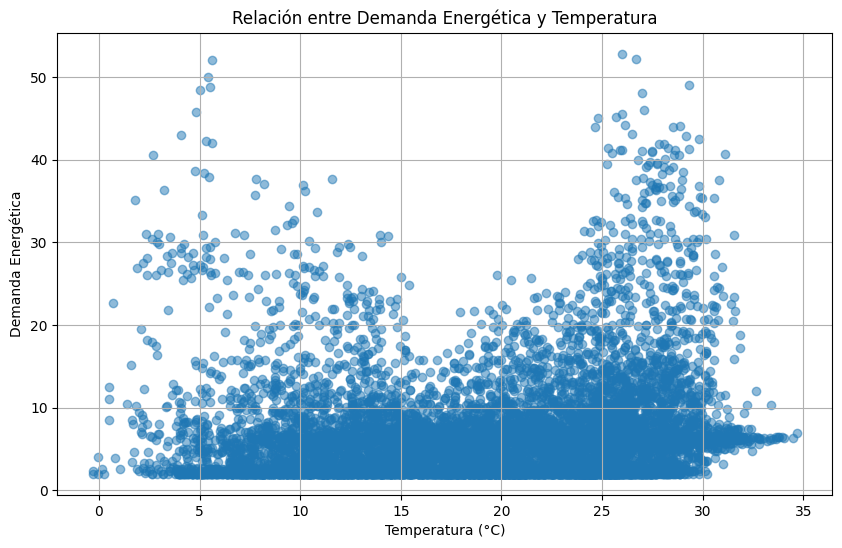

In [ ]:
def plot_temp_vs_demand(df):
    df = df.copy()
    df.set_index("Date", inplace=True)
    df_1h = df.resample('1h').mean()
    plt.figure(figsize=(10, 6))
    plt.scatter(df_1h['temp [C]'], df_1h['Demand'], alpha=0.5)
    plt.title('Relación entre Demanda Energética y Temperatura')
    plt.xlabel('Temperatura (°C)')
    plt.ylabel('Demanda Energética')
    plt.grid(True)
    plt.show()
plot_temp_vs_demand(df)

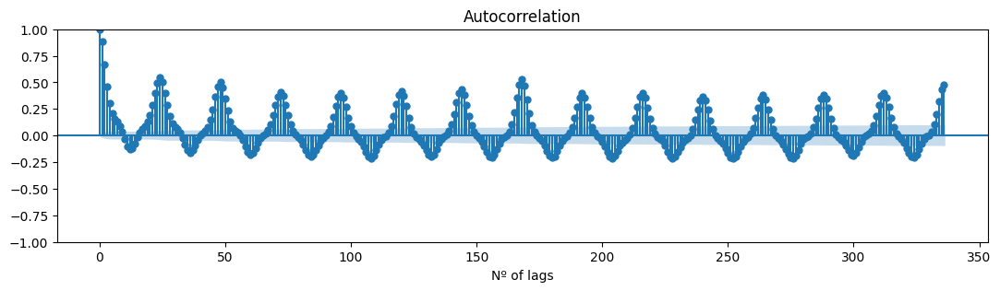

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#Gráfico de autocorrelación 1
def corrPlot(df):
    df = df.copy()
    df.set_index("Date", inplace=True)
    demand_df_1h = df.resample('1h').mean()
    fig, ax = plt.subplots(figsize=(13, 3))
    plt.xlabel("Nº of lags")
    plot_acf(demand_df_1h.Demand, ax=ax, lags=24*14)
    plt.show()
corrPlot(df)

In [ ]:
def partcorrPlot(df):
    df = df.copy()
    df.set_index("Date", inplace=True)
    demand_df_1h = df.resample('1h').mean()
    fig, ax = plt.subplots(figsize=(13, 3))
    plt.xlabel("Nº of lags")
    plot_pacf(demand_df_1h.Demand, ax=ax, lags=24*14)
    plt.show()
partcorrPlot(df)

NameError: name 'df' is not defined

Text(0.5, 1.0, 'Pearson Correlation Matrix')

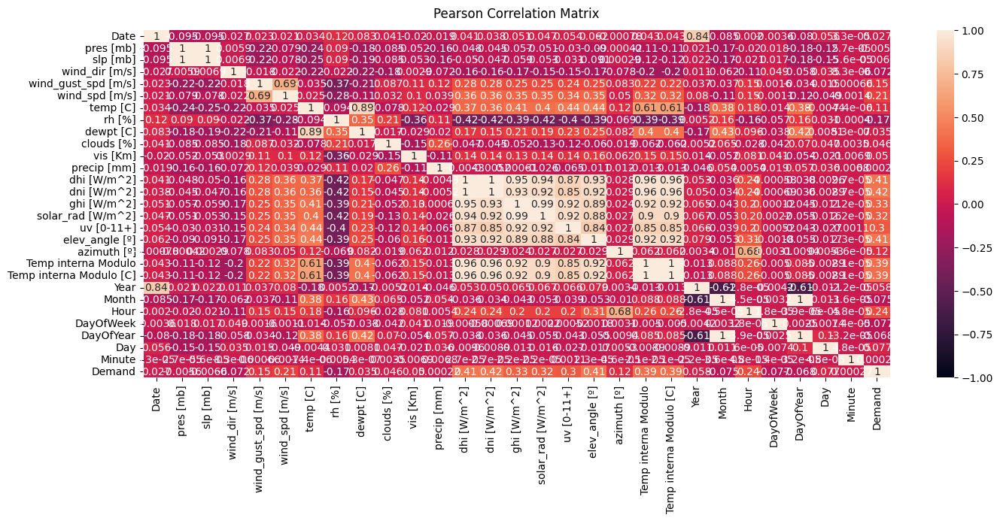

In [820]:
import seaborn as sns
#Correlation Map using Pearson Correlation
plt.figure(figsize=(16,6))
corr_df = df.copy()
#Drop Columns
heatmap = sns.heatmap(corr_df.corr('pearson'), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Pearson Correlation Matrix', fontdict={'fontsize': 12}, pad=12)

In [821]:
df.describe()["Demand"]

count    46753.000000
mean         6.530468
min          2.000000
25%          2.500000
50%          5.798000
75%          7.000000
max         55.696000
std          6.010978
Name: Demand, dtype: float64

In [822]:
def cyclical_encoding(df, cycle_length_list, columns):
    for col, cycle_length in zip(columns, cycle_length_list):
        if df[col].min == 0:
            df[f"{col}_sin"] = np.sin((df[col] / cycle_length) * np.pi * 2).round(4)
            df[f"{col}_cos"] = np.cos((df[col] / cycle_length) * np.pi * 2).round(4)
        else:
            df[f"{col}_sin"] = np.sin(((df[col] - 1) / cycle_length) * np.pi * 2).round(4)
            df[f"{col}_cos"] = np.cos(((df[col] - 1) / cycle_length) * np.pi * 2).round(4)
    return df

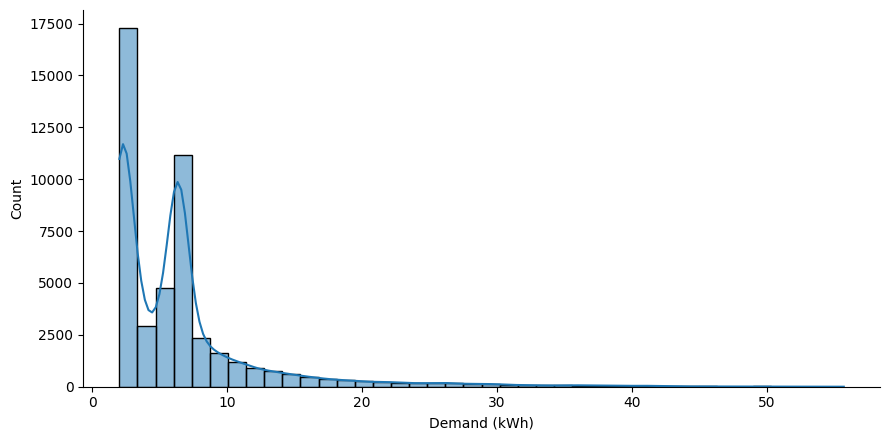

In [823]:
fg = sns.displot(df['Demand'], height=4.5, aspect= 2, bins=40, kde=True)
fg.set_axis_labels("Demand (kWh)", "Count")
fg.savefig("../results/distplot.png")

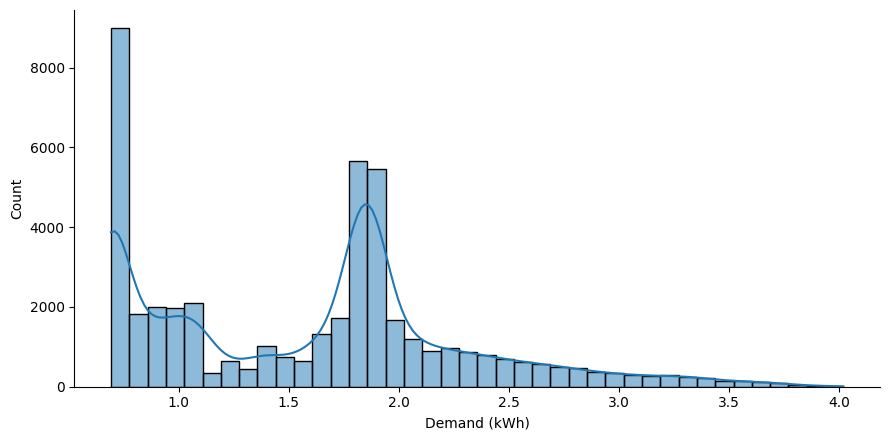

In [824]:
quant_df = df.copy()
quant_df["Demand"] = np.log(quant_df["Demand"])
fg = sns.displot(quant_df['Demand'], height=4.5, aspect= 2, bins=40, kde=True)
fg.set_axis_labels("Demand (kWh)", "Count")
fg.savefig("../results/distplot_quant_trans.png")

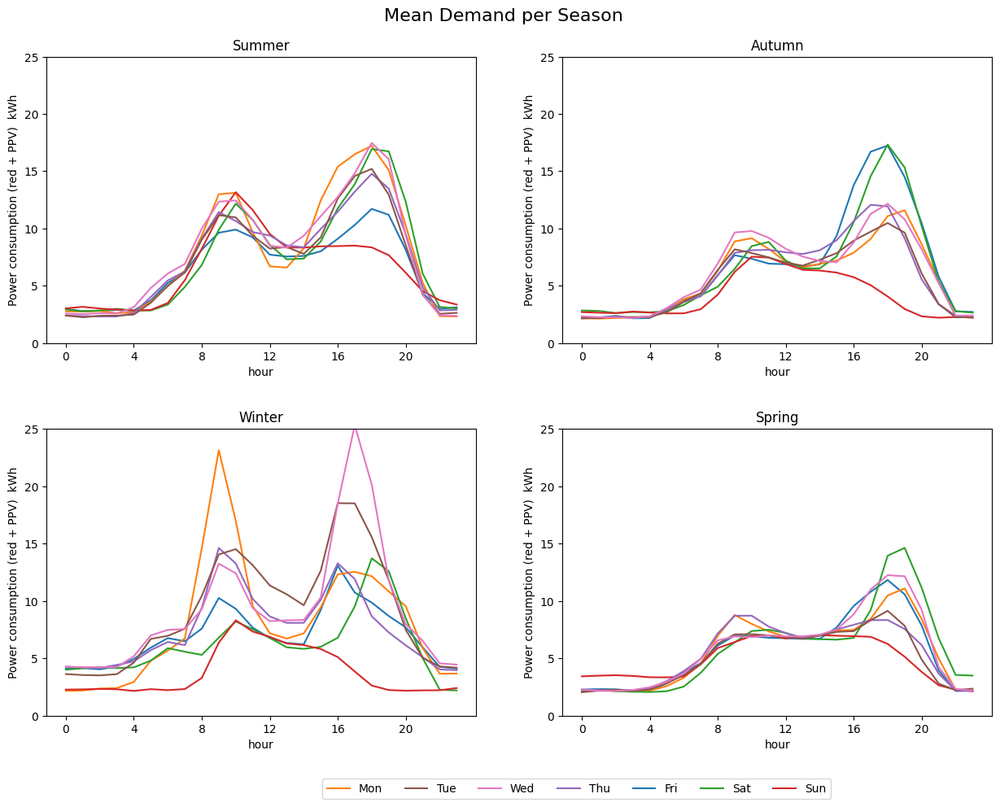

In [825]:
days_mapping = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
df["Day"] = df["DayOfWeek"].map(days_mapping)
df["Season"] = df["Month"].apply(
    lambda x: (
        1 if x in [3, 4, 5] #Spring
        else 2 if x in [6, 7, 8] #Summer
        else 3 if x in [9, 10, 11] #Autumn
        else 0 #Winter
    )
)
fig, axes = plt.subplots(2, 2)
plt.subplots_adjust(wspace=0.2, hspace=0.3, top=0.92)
fig.suptitle("Mean Demand per Season", fontsize=16)

fig.set_figheight(10)
fig.set_figwidth(15)

ymin, ymax = 0, 25

#Season Summer
df.loc[df["Season"] == 2] \
    .groupby([df.loc[df["Season"] == 2]["Hour"], 'Day'])["Demand"].mean().unstack().plot(
        ax=axes[0, 0], ylim=(ymin, ymax), title="Summer", legend=False
    )
df.loc[df["Season"] == 3] \
    .groupby([df.loc[df["Season"] == 3]["Hour"], 'Day'])["Demand"].mean().unstack().plot(
        ax=axes[0, 1], ylim=(ymin, ymax), title="Autumn", legend=False
    )
df.loc[df["Season"] == 0] \
    .groupby([df.loc[df["Season"] == 0]["Hour"], 'Day'])["Demand"].mean().unstack().plot(
        ax=axes[1, 0], ylim=(ymin, ymax), title="Winter", legend=False
    )
df.loc[df["Season"] == 1] \
    .groupby([df.loc[df["Season"] == 1]["Hour"], 'Day'])["Demand"].mean().unstack().plot(
        ax=axes[1, 1], ylim=(ymin, ymax), title="Spring", legend=False
    )

for ax in axes.flat:
    ax.set(xlabel='hour', ylabel='Power consumption (red + PPV)  kWh')

for n in range(0, 2):
    axes[n, 0].set_xticks([0, 4, 8, 12, 16, 20])
    axes[n, 1].set_xticks([0, 4, 8, 12, 16, 20])
df = df.drop("Day", axis=1)
# LEGEND
handles, labels = plt.gca().get_legend_handles_labels() # reorder Legend Labels
order = [1,5,6,4,0,2,3]      # specify order in Legend
axes[1,1].legend([handles[i] for i in order], [labels[i] for i in order], loc=1, ncol=7, 
                 bbox_to_anchor=(0.638,-0.2), frameon=True) # print and order LEGEND

In [826]:
from sklearn.preprocessing import QuantileTransformer , MinMaxScaler
def addNLags(df, lags=1):
    lag_df= df.copy()
    for i in range(1, lags + 1):
        lag_df[f'lag_{i}'] = lag_df["Demand"].shift(i * 96).fillna(0)

    return lag_df.fillna(0)

def addNLags2(df, lags=1):
    lag_df= df.copy()
    for i in range(3, lags + 1, 2):
        lag_df[f'lag_{i}_rev'] = lag_df["Demand2"].shift(i * 48).fillna(0)

    return lag_df.fillna(0)

def normalizeData(data):
    df = data.copy()
    scaler = MinMaxScaler()
    return scaler.fit_transform(df)

In [827]:
df2 = df.copy()

#Add isWeekend Column based in DayOfTheWeek Value
df2["isWeekend"] = df2["DayOfWeek"].isin([6])

cycle_lengths = [24, 7, 12, 365]
cols = ["Hour", "DayOfWeek", "Month", "DayOfYear"]

df2 = cyclical_encoding(df2, cycle_lengths, cols)

#quantile_transformer = QuantileTransformer(output_distribution='uniform', random_state=42) 
#df2["Demand2"] = quantile_transformer.fit_transform(df2["Demand"].values.reshape(-1, 1)).flatten()
df2["Demand"] = np.log1p(df["Demand"])

df2 = addNLags(df2, 5)
#df2 = addNLags2(df2, 5)

#df2 = df2.drop(columns=["Demand2"], axis=1)

df2.columns

Index(['Date', 'pres [mb]', 'slp [mb]', 'wind_dir [m/s]',
       'wind_gust_spd [m/s]', 'wind_spd [m/s]', 'temp [C]', 'rh [%]',
       'dewpt [C]', 'clouds [%]', 'vis [Km]', 'precip [mm]', 'dhi [W/m^2]',
       'dni [W/m^2]', 'ghi [W/m^2]', 'solar_rad [W/m^2]', 'uv [0-11+]',
       'elev_angle [º]', 'azimuth [º]', 'Temp interna Modulo',
       'Temp interna Modulo [C]', 'Year', 'Month', 'Hour', 'DayOfWeek',
       'DayOfYear', 'Minute', 'Demand', 'Season', 'isWeekend', 'Hour_sin',
       'Hour_cos', 'DayOfWeek_sin', 'DayOfWeek_cos', 'Month_sin', 'Month_cos',
       'DayOfYear_sin', 'DayOfYear_cos', 'lag_1', 'lag_2', 'lag_3', 'lag_4',
       'lag_5'],
      dtype='object')

In [828]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import pdist

new_df = df2.copy()
new_df.set_index("Date", inplace=True)
new_df = new_df.resample('1d').mean()
new_df.reset_index(inplace=True)
new_df = new_df[["Date", "temp [C]"]]
scaler = MinMaxScaler()
new_df['temp_sta'] = scaler.fit_transform(new_df[["temp [C]"]])
dist_matrix = pdist(new_df[['temp_sta']], metric='euclidean')
linked = linkage(dist_matrix, method="centroid")

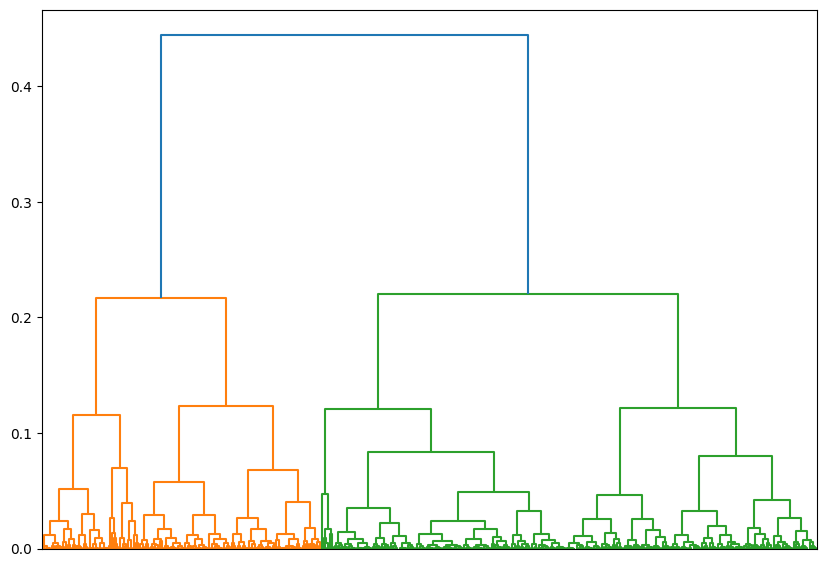

In [829]:
plt.figure(figsize=(10, 7))
dendrogram(linked, orientation='top',  no_labels=True)
plt.show()

In [830]:
new_df['cluster'] = fcluster(linked, 3, criterion='maxclust')
# Weekly Demand Plot
fig = go.Figure()
fig.add_trace(go.Scatter(x=new_df.Date, y=new_df["cluster"], mode='lines'))
fig.update_layout(
    title = "Weekly Energy Demand",
    xaxis_title = "Date",
    yaxis_title = "Demand (MWh)",
    width = 850,
    height = 400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

In [831]:
new_df.set_index("Date", inplace=True)
new_df = new_df.resample('15T').ffill().reset_index()

In [832]:
df2 = df2.merge(new_df[["Date", "cluster"]], on="Date", how='inner')

In [833]:
import holidays
def generateHolidayVar(df):
    df["Reduced_Date"] = df["Date"].dt.date
    list_holidays = holidays.Spain(prov="CT", years=list(df["Year"].unique()))
    list_holidays_dates = np.array(list(list_holidays.keys()), dtype='datetime64')
    df["isHoliday"] = df["Reduced_Date"].isin(list_holidays_dates)
    df = df.drop('Reduced_Date', axis=1)
    return df

df2 = generateHolidayVar(df2)


df3 = df2.copy()
dates = df3["Date"]
df3.set_index("Date", inplace=True)
df3 = df3.resample('1H').mean()
df3 = df3.reset_index()
df3

,Date,pres [mb],slp [mb],wind_dir [m/s],wind_gust_spd [m/s],wind_spd [m/s],temp [C],rh [%],dewpt [C],clouds [%],...,Month_cos,DayOfYear_sin,DayOfYear_cos,lag_1,lag_2,lag_3,lag_4,lag_5,cluster,isHoliday
0,2022-07-02 00:00:00,1019.000,1020.000,213.750,2.62500,1.50000,22.6875,60.875,14.7750,0.000,...,-1.0,0.0086,-1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,2.0,0.0
1,2022-07-02 01:00:00,1019.000,1020.000,331.250,2.55000,1.72500,21.7375,65.500,15.0125,0.000,...,-1.0,0.0086,-1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,2.0,0.0
2,2022-07-02 02:00:00,1019.000,1019.625,353.750,2.79375,2.28750,21.1125,68.375,15.0875,0.000,...,-1.0,0.0086,-1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,2.0,0.0
3,2022-07-02 03:00:00,1018.625,1019.000,360.000,4.20000,2.97500,20.7250,70.125,15.0875,0.000,...,-1.0,0.0086,-1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,2.0,0.0
4,2022-07-02 04:00:00,1018.000,1018.625,356.250,4.90000,3.60000,20.4875,72.375,15.3625,0.000,...,-1.0,0.0086,-1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11684,2023-10-31 20:00:00,1015.000,1016.000,191.250,5.50000,1.90000,15.6250,56.750,7.0500,18.500,...,0.0,-0.8759,0.4825,2.276495,1.284867,2.131290,2.387817,2.428792,1.0,0.0
11685,2023-10-31 21:00:00,1015.000,1016.000,133.750,6.00000,1.37500,14.8875,58.375,6.8000,14.500,...,0.0,-0.8759,0.4825,1.529645,1.098612,1.568955,1.529645,1.568955,1.0,0.0
11686,2023-10-31 22:00:00,1014.625,1015.625,330.625,5.85000,2.06875,14.5125,59.750,6.8000,16.875,...,0.0,-0.8759,0.4825,1.284867,1.098612,1.098612,1.284867,1.212947,1.0,0.0
11687,2023-10-31 23:00:00,1014.000,1015.000,320.625,5.45000,2.62500,13.8250,62.875,6.8750,25.000,...,0.0,-0.8759,0.4825,1.098612,1.098612,1.098612,1.098612,1.284867,1.0,0.0


In [834]:
df3 = df3.drop(columns=["Temp interna Modulo"], axis=1)
df3 = df3.rename(columns={'pres [mb]': 'pres', 'slp [mb]':'slp', 'wind_dir [m/s]': 'wind_dir', 'wind_gust_spd [m/s]': 'wind_gust_spd', 
    'wind_spd [m/s]': 'wind_spd', 'temp [C]': 'temp', 'app_temp [C]': 'app_temp', 'rh [%]': 'rh', 'dewpt [C]': 'dewpt','clouds [%]': 'clouds',
    'vis [Km]':'vis', 'precip [mm]': 'precip', 'dhi [W/m^2]': 'dhi', 'dni [W/m^2]': 'dni', 'ghi [W/m^2]': 'ghi', 'solar_rad [W/m^2]': 'solar_rad', 'uv [0-11+]': 'uv',
    'elev_angle [º]': 'elev_angle', 'azimuth [º]': 'az', 'Temp interna Modulo [C]': 'Temp interna Modulo'})
df3.to_csv('./prueba_csv.csv', index=None)
df3 = df3.drop(columns=["Date"], axis=1)

In [835]:
trainingSize = int(0.6 * df3.shape[0])
validationSize = int(0.2 * df3.shape[0]) + trainingSize
y = df3["Demand"]

X = df3.drop(columns=["Demand"], axis=1)
col_names = list(X.columns)

X_train, y_train = X.loc[:trainingSize].copy(), y.loc[:trainingSize].copy()
X_val, y_val = X.loc[trainingSize:validationSize, :].copy(), y.loc[trainingSize:validationSize].copy()
X_test, y_test = X.loc[validationSize:, :].copy(), y.loc[validationSize:].copy()

X_train_dates = dates.loc[:trainingSize].copy()
X_val_dates = dates.loc[trainingSize:validationSize].copy()
X_test_dates = dates.loc[validationSize:].copy()

print(f"Total Lags: {len(df3)}")
print(f"Training Size:{len(X_train)}")
print(f"Validation Size:{len(X_val)}")
print(f"Test Size: {len(X_test)}")
col_names

Total Lags: 11689
Training Size:7014
Validation Size:2338
Test Size: 2339


['pres',
 'slp',
 'wind_dir',
 'wind_gust_spd',
 'wind_spd',
 'temp',
 'rh',
 'dewpt',
 'clouds',
 'vis',
 'precip',
 'dhi',
 'dni',
 'ghi',
 'solar_rad',
 'uv',
 'elev_angle',
 'az',
 'Temp interna Modulo',
 'Year',
 'Month',
 'Hour',
 'DayOfWeek',
 'DayOfYear',
 'Minute',
 'Season',
 'isWeekend',
 'Hour_sin',
 'Hour_cos',
 'DayOfWeek_sin',
 'DayOfWeek_cos',
 'Month_sin',
 'Month_cos',
 'DayOfYear_sin',
 'DayOfYear_cos',
 'lag_1',
 'lag_2',
 'lag_3',
 'lag_4',
 'lag_5',
 'cluster',
 'isHoliday']

In [836]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.metrics import mean_absolute_error, root_mean_squared_error

from sklearn.preprocessing import QuantileTransformer 
#quantile_transformer = QuantileTransformer(output_distribution='uniform', random_state=42) 
#y_train_transformed_quantile = quantile_transformer.fit_transform(y_train.values.reshape(-1, 1)).flatten() 
#y_val_transformed_quantile = quantile_transformer.fit_transform(y_val.values.reshape(-1, 1)).flatten() 

regressorXGBR = XGBRegressor(objective='reg:absoluteerror', n_estimators=1400, learning_rate = 0.003, max_depth=7, colsample_bytree = 0.9, colsample_bynode = 0.9, gamma=7, random_state=123,  eval_metric='mae', early_stopping_rounds=100)
regressorXGBR2 = XGBRegressor(objective='reg:absoluteerror', n_estimators=1400, learning_rate = 0.003, max_depth=7, colsample_bytree = 0.9, colsample_bynode = 0.9, gamma=7, random_state=123,  eval_metric='mae')


regressorXGBR2.fit(
    X = pd.concat([X_train, X_val], axis=0),
    y = np.concatenate([y_train, y_val], axis=0),
    verbose=0
    #eval_set=[(X_val, y_val_transformed_quantile)]
)
'''
regressorXGBR.fit(
    X = X_train,
    y = y_train_transformed_quantile,
    eval_set=[(X_val, y_val_transformed_quantile)],
    verbose=0
)
LGBM = LGBMRegressor(boosting_type='gbdt', n_estimators=1300, learning_rate=0.01, random_state=123, n_jobs=-1, verbose=0)
LGBM.fit(
    X = pd.concat([X_train, X_val], axis=0),
    y = np.concatenate([y_train_transformed_quantile, y_val_transformed_quantile], axis=0)
    #eval_set=[(X_val, y_val_transformed_quantile)]
)
regressorXGBR.fit(
    X = pd.concat([X_train, X_val], axis=0),
    y = np.concatenate([y_train_transformed_quantile, y_val_transformed_quantile], axis=0)
    #eval_set=[(X_val, y_val_transformed_quantile)]
)

knn = KNeighborsRegressor(n_neighbors=20, weights='distance')
knn.fit(
    X = X_train,
    y = y_train_transformed_quantile
)
y_pred = knn.predict(X_test)
y_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()
print(f"KNN MAE: {mean_absolute_error(y_test, y_pred)}, RMSE: {root_mean_squared_error(y_test, y_pred)}")
'''

'\nregressorXGBR.fit(\n    X = X_train,\n    y = y_train_transformed_quantile,\n    eval_set=[(X_val, y_val_transformed_quantile)],\n    verbose=0\n)\nLGBM = LGBMRegressor(boosting_type=\'gbdt\', n_estimators=1300, learning_rate=0.01, random_state=123, n_jobs=-1, verbose=0)\nLGBM.fit(\n    X = pd.concat([X_train, X_val], axis=0),\n    y = np.concatenate([y_train_transformed_quantile, y_val_transformed_quantile], axis=0)\n    #eval_set=[(X_val, y_val_transformed_quantile)]\n)\nregressorXGBR.fit(\n    X = pd.concat([X_train, X_val], axis=0),\n    y = np.concatenate([y_train_transformed_quantile, y_val_transformed_quantile], axis=0)\n    #eval_set=[(X_val, y_val_transformed_quantile)]\n)\n\nknn = KNeighborsRegressor(n_neighbors=20, weights=\'distance\')\nknn.fit(\n    X = X_train,\n    y = y_train_transformed_quantile\n)\ny_pred = knn.predict(X_test)\ny_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()\nprint(f"KNN MAE: {mean_absolute_error(y_test, y_pred)}, R

In [837]:
#y_pred = regressorXGBR.predict(X_test)
#y_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()
#print(f"XGBR MAE: {mean_absolute_error(y_test, y_pred)}, RMSE: {root_mean_squared_error(y_test, y_pred)}")
y_pred = regressorXGBR2.predict(X_test)
y_pred = np.exp(y_pred)
y_test = np.exp(y_test)
#y_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()
print(f"XGBR MAE: {mean_absolute_error(y_test, y_pred)}, RMSE: {root_mean_squared_error(y_test, y_pred)}")

XGBR MAE: 1.4813170928746549, RMSE: 3.2539876551306155


In [838]:
def plotPredictions(dates, y_pred, y_test):
    fig = go.Figure()
    trace1 = go.Scatter(x=dates, y=y_test, name="test", mode="lines")
    trace2 = go.Scatter(x=dates, y=y_pred, name="predictions", mode="lines")
    fig.add_trace(trace1)
    fig.add_trace(trace2)
    fig.update_layout(
        title="Real value vs Predicted in Test Data",
        xaxis_title="Date Time",
        yaxis_title="Demand",
        width=1020,
        height=450,
        margin = dict(l=70, r=20, t=55, b=20),
        legend = dict(
            orientation = "h",
            yanchor="top",
            y=1.1,
            xanchor="left",
            x=0.76
        )
    )
    fig.show()
plotPredictions(X_test_dates, y_pred, y_test)

In [839]:
plotPredictions(X_test_dates[:30*24], y_pred[:30*24], y_test[:30*24])

In [840]:
plotPredictions(X_test_dates[:24*7], y_pred[:24*7], y_test[:24*7])

In [842]:
from tqdm import tqdm
from sklearn.model_selection import ParameterGrid
paramsXGB = {
    'max_depth': [7, 8],
    'learning_rate': [0.005, 0.003],
    'gamma': [7, 8, 9],
    'colsample_bytree' : [0.7, 0.9, 1],
    'colsample_bynode': [ 0.7, 0.9, 1],
    'n_estimators': [1300]
}
paramsLGBM = {
    'num_leaves': [20, 30, 40, 50],
    'learning_rate': [0.05, 0.01, 0.005],
    'colsample_bytree' : [0.7, 0.9, 1],
    'n_estimators': [1200],
    'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100]
}
def gridSearchXGB(params):
    best_mae = float('inf')
    config = {}
    for param in tqdm(ParameterGrid(params), total=len(list(ParameterGrid(params)))):
        max_depth = param.get('max_depth')
        n_estimators = param.get('n_estimators')
        lr = param.get('learning_rate')
        gamma = param.get('gamma')
        colsample_bytree = param.get('colsample_bytree')
        colsample_bynode = param.get('colsample_bynode')
        regressorXGBR = XGBRegressor(objective='reg:absoluteerror', n_estimators=n_estimators, learning_rate = lr, max_depth=max_depth, colsample_bytree = colsample_bytree, colsample_bynode = colsample_bynode, gamma=gamma, random_state=123)
        '''
        regressorXGBR.fit(
            X = X_train,
            y = y_train_transformed_quantile,
            eval_set=[(X_val, y_val_transformed_quantile)],
            verbose=0
        )  
        '''
        regressorXGBR.fit(
            X = pd.concat([X_train, X_val], axis=0),
            y = np.concatenate([y_train, y_val], axis=0),
            verbose=0
            #eval_set=[(X_val, y_val_transformed_quantile)]
        )
        y_pred = regressorXGBR.predict(X_test)
        y_pred = np.exp(y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        if mae < best_mae: 
            best_mae = mae
            config = param
        print(f"MAE: {mae}, n_Estimators: {n_estimators}, Learning_rate: {lr}, Max_depth: {max_depth}, Gamma: {gamma}, Col_Sample_By_Tree: {colsample_bytree}, Col_Sample_By_Node: {colsample_bynode}")
    config["mae"] = best_mae
    return config


def gridSearchLGBM(params):
    best_mae = float('inf')
    config = {}
    for param in tqdm(ParameterGrid(params), total=len(list(ParameterGrid(params)))):
        n_estimators = param.get('n_estimators')
        num_leaves = param.get('num_leaves')
        lr = param.get('learning_rate')
        reg_alpha = param.get('reg_alpha')
        colsample_bytree = param.get('colsample_bytree')
        LGBMReg = LGBMRegressor(boosting_type='goss', objective='regression' ,n_estimators=n_estimators, learning_rate=lr, random_state=123, reg_alpha=reg_alpha, n_jobs=-1, verbose=-1, early_stopping_rounds=100, num_leaves=num_leaves) 
        LGBMReg.fit(
            X = X_train,
            y = y_train_transformed_quantile,
            eval_set=[(X_val, y_val_transformed_quantile)],
        )  
        y_pred = LGBMReg.predict(X_test)
        y_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()
        mae = mean_absolute_error(y_test, y_pred)
        if mae < best_mae: 
            best_mae = mae
            config = param
        print(f"MAE: {mae}, n_Estimators: {n_estimators}, Learning_rate: {lr}, Num_leaves: {num_leaves}, Col_Sample_By_Tree: {colsample_bytree}, reg_alpha: {reg_alpha}")
    config["mae"] = best_mae
    return config
gridSearchXGB(paramsXGB)
#gridSearchLGBM(paramsLGBM)

  1%|          | 1/108 [00:09<17:02,  9.56s/it]

MAE: 1.485446192440232, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


  2%|▏         | 2/108 [00:18<15:55,  9.02s/it]

MAE: 1.4936098369170239, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


  3%|▎         | 3/108 [00:27<16:22,  9.36s/it]

MAE: 1.466604544952381, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


  4%|▎         | 4/108 [00:38<16:43,  9.65s/it]

MAE: 1.4956462281024658, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


  5%|▍         | 5/108 [00:45<14:56,  8.70s/it]

MAE: 1.4841805417981537, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


  6%|▌         | 6/108 [00:54<14:55,  8.78s/it]

MAE: 1.496797767321265, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


  6%|▋         | 7/108 [01:01<14:03,  8.35s/it]

MAE: 1.4841276890257213, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


  7%|▋         | 8/108 [01:09<13:48,  8.29s/it]

MAE: 1.5062098361458067, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


  8%|▊         | 9/108 [01:16<12:50,  7.78s/it]

MAE: 1.4879425937395718, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


  9%|▉         | 10/108 [01:24<12:43,  7.79s/it]

MAE: 1.4636955469306212, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


 10%|█         | 11/108 [01:29<11:37,  7.19s/it]

MAE: 1.4766083008502824, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


 11%|█         | 12/108 [01:36<11:06,  6.94s/it]

MAE: 1.4751359741736705, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.7


 12%|█▏        | 13/108 [01:42<10:29,  6.62s/it]

MAE: 1.4652067157221487, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.7


 13%|█▎        | 14/108 [01:49<10:39,  6.80s/it]

MAE: 1.5133466185023219, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.7


 14%|█▍        | 15/108 [01:55<10:20,  6.67s/it]

MAE: 1.4686094225167856, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.7


 15%|█▍        | 16/108 [02:02<10:28,  6.83s/it]

MAE: 1.5222011587025428, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.7


 16%|█▌        | 17/108 [02:08<09:43,  6.41s/it]

MAE: 1.4739839174005203, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.7


 17%|█▋        | 18/108 [02:14<09:24,  6.28s/it]

MAE: 1.4920641665981413, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.7


 18%|█▊        | 19/108 [02:20<09:15,  6.24s/it]

MAE: 1.4547659527761798, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.7


 19%|█▊        | 20/108 [02:27<09:26,  6.44s/it]

MAE: 1.518960100846508, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.7


 19%|█▉        | 21/108 [02:32<08:54,  6.14s/it]

MAE: 1.4599698652619162, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.7


 20%|██        | 22/108 [02:38<08:43,  6.09s/it]

MAE: 1.4811108802942905, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.7


 21%|██▏       | 23/108 [02:45<08:41,  6.13s/it]

MAE: 1.473974148298733, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.7


 22%|██▏       | 24/108 [02:52<08:59,  6.42s/it]

MAE: 1.4924302743059736, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.7


 23%|██▎       | 25/108 [02:58<08:53,  6.43s/it]

MAE: 1.482736639995982, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.7


 24%|██▍       | 26/108 [03:05<09:09,  6.70s/it]

MAE: 1.5047045287872012, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.7


 25%|██▌       | 27/108 [03:12<09:08,  6.77s/it]

MAE: 1.4503107814151202, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.7


 26%|██▌       | 28/108 [03:21<09:35,  7.20s/it]

MAE: 1.4934057555909552, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.7


 27%|██▋       | 29/108 [03:26<08:56,  6.80s/it]

MAE: 1.4764781325701803, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.7


 28%|██▊       | 30/108 [03:33<08:47,  6.76s/it]

MAE: 1.4881947404716942, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.7


 29%|██▊       | 31/108 [03:40<08:39,  6.75s/it]

MAE: 1.471662297700334, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.7


 30%|██▉       | 32/108 [03:48<08:53,  7.02s/it]

MAE: 1.4915344902856318, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.7


 31%|███       | 33/108 [03:53<08:21,  6.69s/it]

MAE: 1.4774715856775356, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.7


 31%|███▏      | 34/108 [04:00<08:08,  6.60s/it]

MAE: 1.475958171875777, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.7


 32%|███▏      | 35/108 [04:07<08:07,  6.67s/it]

MAE: 1.490661933562179, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.7


 33%|███▎      | 36/108 [04:14<08:12,  6.84s/it]

MAE: 1.4728640219754678, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.7


 34%|███▍      | 37/108 [04:20<07:51,  6.64s/it]

MAE: 1.490318489181477, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.9


 35%|███▌      | 38/108 [04:27<07:51,  6.73s/it]

MAE: 1.5099038714570507, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.9


 36%|███▌      | 39/108 [04:34<07:58,  6.93s/it]

MAE: 1.4519359420442575, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.9


 37%|███▋      | 40/108 [04:42<08:08,  7.19s/it]

MAE: 1.505095131856124, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.9


 38%|███▊      | 41/108 [04:48<07:33,  6.77s/it]

MAE: 1.5001449097655375, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.9


 39%|███▉      | 42/108 [04:55<07:22,  6.70s/it]

MAE: 1.48033015130392, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.9


 40%|███▉      | 43/108 [05:01<07:08,  6.59s/it]

MAE: 1.455777750611403, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.9


 41%|████      | 44/108 [05:09<07:24,  6.94s/it]

MAE: 1.4951835338481863, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.9


 42%|████▏     | 45/108 [05:14<06:52,  6.55s/it]

MAE: 1.4754306416956158, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.9


 43%|████▎     | 46/108 [05:21<06:40,  6.46s/it]

MAE: 1.476396057461982, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.9


 44%|████▎     | 47/108 [05:29<07:19,  7.21s/it]

MAE: 1.498992882536775, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.9


 44%|████▍     | 48/108 [05:39<07:56,  7.93s/it]

MAE: 1.4903232825766097, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 0.9


 45%|████▌     | 49/108 [05:46<07:24,  7.53s/it]

MAE: 1.4561353153470886, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.9


 46%|████▋     | 50/108 [05:53<07:15,  7.51s/it]

MAE: 1.5363995814080837, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.9


 47%|████▋     | 51/108 [06:01<07:05,  7.47s/it]

MAE: 1.4796483488542957, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.9


 48%|████▊     | 52/108 [06:10<07:29,  8.04s/it]

MAE: 1.4874661161928242, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.9


 49%|████▉     | 53/108 [06:16<06:51,  7.48s/it]

MAE: 1.487825629103711, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.9


 50%|█████     | 54/108 [06:24<06:51,  7.63s/it]

MAE: 1.4843302670875111, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.9


 51%|█████     | 55/108 [06:31<06:31,  7.39s/it]

MAE: 1.4768252019164905, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.9


 52%|█████▏    | 56/108 [06:39<06:32,  7.54s/it]

MAE: 1.5220389559387306, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.9


 53%|█████▎    | 57/108 [06:45<06:01,  7.09s/it]

MAE: 1.4781158812533841, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.9


 54%|█████▎    | 58/108 [06:52<05:53,  7.07s/it]

MAE: 1.4662829486164974, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.9


 55%|█████▍    | 59/108 [06:59<05:43,  7.01s/it]

MAE: 1.4724257493028743, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.9


 56%|█████▌    | 60/108 [07:06<05:45,  7.19s/it]

MAE: 1.4952381676255784, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 0.9


 56%|█████▋    | 61/108 [07:13<05:29,  7.01s/it]

MAE: 1.4766740121980915, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.9


 57%|█████▋    | 62/108 [07:21<05:33,  7.26s/it]

MAE: 1.4713095486736907, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.9


 58%|█████▊    | 63/108 [07:28<05:28,  7.29s/it]

MAE: 1.465689257893466, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.9


 59%|█████▉    | 64/108 [07:37<05:39,  7.70s/it]

MAE: 1.4919117319949267, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.9


 60%|██████    | 65/108 [07:43<05:17,  7.38s/it]

MAE: 1.4704901421864782, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.9


 61%|██████    | 66/108 [07:51<05:07,  7.33s/it]

MAE: 1.4729097605759245, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.9


 62%|██████▏   | 67/108 [07:58<05:01,  7.34s/it]

MAE: 1.4661772748882493, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.9


 63%|██████▎   | 68/108 [08:06<05:04,  7.61s/it]

MAE: 1.4731979071635637, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.9


 64%|██████▍   | 69/108 [08:12<04:41,  7.21s/it]

MAE: 1.484553607319729, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.9


 65%|██████▍   | 70/108 [08:19<04:29,  7.10s/it]

MAE: 1.4450850284270305, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.9


 66%|██████▌   | 71/108 [08:26<04:22,  7.11s/it]

MAE: 1.4680720516822887, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.9


 67%|██████▋   | 72/108 [08:35<04:26,  7.40s/it]

MAE: 1.4566238773561695, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 0.9


 68%|██████▊   | 73/108 [08:41<04:05,  7.02s/it]

MAE: 1.4455676980397811, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 1


 69%|██████▊   | 74/108 [08:47<03:56,  6.95s/it]

MAE: 1.5030007068732512, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 1


 69%|██████▉   | 75/108 [08:54<03:47,  6.90s/it]

MAE: 1.4537232043275947, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 1


 70%|███████   | 76/108 [09:02<03:51,  7.22s/it]

MAE: 1.503293550733432, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 1


 71%|███████▏  | 77/108 [09:08<03:33,  6.89s/it]

MAE: 1.455907241079683, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 1


 72%|███████▏  | 78/108 [09:15<03:22,  6.75s/it]

MAE: 1.4794975653785183, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 1


 73%|███████▎  | 79/108 [09:21<03:13,  6.69s/it]

MAE: 1.4642758527183828, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 1


 74%|███████▍  | 80/108 [09:29<03:13,  6.92s/it]

MAE: 1.529795341155046, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 1


 75%|███████▌  | 81/108 [09:34<02:56,  6.56s/it]

MAE: 1.473486125393694, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 1


 76%|███████▌  | 82/108 [09:41<02:48,  6.46s/it]

MAE: 1.4941176025743201, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 1


 77%|███████▋  | 83/108 [09:47<02:40,  6.42s/it]

MAE: 1.4597598387867783, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 1


 78%|███████▊  | 84/108 [09:54<02:38,  6.61s/it]

MAE: 1.4843023919972145, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 0.7, Col_Sample_By_Node: 1


 79%|███████▊  | 85/108 [10:01<02:32,  6.62s/it]

MAE: 1.454531964007833, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 1


 80%|███████▉  | 86/108 [10:09<02:34,  7.02s/it]

MAE: 1.4681141273189036, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 1


 81%|████████  | 87/108 [10:16<02:28,  7.07s/it]

MAE: 1.4611825833889984, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 1


 81%|████████▏ | 88/108 [10:24<02:29,  7.49s/it]

MAE: 1.4659654612914907, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 1


 82%|████████▏ | 89/108 [10:31<02:16,  7.20s/it]

MAE: 1.471386080412287, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 1


 83%|████████▎ | 90/108 [10:38<02:07,  7.10s/it]

MAE: 1.4979829773411462, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 1


 84%|████████▍ | 91/108 [10:45<01:59,  7.04s/it]

MAE: 1.458358097308224, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 1


 85%|████████▌ | 92/108 [10:53<01:57,  7.35s/it]

MAE: 1.4614484477419518, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 1


 86%|████████▌ | 93/108 [10:59<01:45,  7.02s/it]

MAE: 1.4509036252335283, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 1


 87%|████████▋ | 94/108 [11:06<01:36,  6.92s/it]

MAE: 1.5763803444391782, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 1


 88%|████████▊ | 95/108 [11:13<01:29,  6.92s/it]

MAE: 1.4682963256271473, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 1


 89%|████████▉ | 96/108 [11:20<01:25,  7.13s/it]

MAE: 1.4394610657711338, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 0.9, Col_Sample_By_Node: 1


 90%|████████▉ | 97/108 [11:29<01:23,  7.57s/it]

MAE: 1.4859258231608334, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 1


 91%|█████████ | 98/108 [11:38<01:20,  8.04s/it]

MAE: 1.48489718771587, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 1


 92%|█████████▏| 99/108 [11:46<01:13,  8.15s/it]

MAE: 1.4815858709466168, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 7, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 1


 93%|█████████▎| 100/108 [11:57<01:12,  9.03s/it]

MAE: 1.4375805440153289, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 7, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 1


 94%|█████████▎| 101/108 [12:04<00:57,  8.24s/it]

MAE: 1.4588928389677231, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 1


 94%|█████████▍| 102/108 [12:12<00:48,  8.11s/it]

MAE: 1.4518004935023143, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 1


 95%|█████████▌| 103/108 [12:19<00:38,  7.79s/it]

MAE: 1.4708776802680117, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 8, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 1


 96%|█████████▋| 104/108 [12:27<00:31,  7.90s/it]

MAE: 1.4771593061640387, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 8, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 1


 97%|█████████▋| 105/108 [12:33<00:22,  7.38s/it]

MAE: 1.5145240493944256, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 1


 98%|█████████▊| 106/108 [12:40<00:14,  7.26s/it]

MAE: 1.4386275556563575, n_Estimators: 1300, Learning_rate: 0.005, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 1


 99%|█████████▉| 107/108 [12:47<00:07,  7.11s/it]

MAE: 1.4604881603549598, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 7, Gamma: 9, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 1


100%|██████████| 108/108 [12:55<00:00,  7.18s/it]

MAE: 1.4765182179238645, n_Estimators: 1300, Learning_rate: 0.003, Max_depth: 8, Gamma: 9, Col_Sample_By_Tree: 1, Col_Sample_By_Node: 1


{'colsample_bynode': 1,
 'colsample_bytree': 1,
 'gamma': 7,
 'learning_rate': 0.003,
 'max_depth': 8,
 'n_estimators': 1300,
 'mae': 1.4375805440153289}

In [ ]:
from sklearn.model_selection import TimeSeriesSplit

def walkForwardValidation(X, y, X_test, y_test, fixed_train=False):
    n_splits = 10
    results = pd.DataFrame(columns=["RMSE_Test", "RMSE_Val", "MAE_Test", "MAE_Val","Mean_MRSE_Test", "Mean_MAE_Test", "Mean_RMSE_Val", "Mean_MAE_Val"])
    X_test2 = X_test.copy()
    X2 = X.copy()

    if fixed_train:
        tscv = TimeSeriesSplit(n_splits=n_splits, max_train_size=X.shape[0] // n_splits)
    else:
        tscv = TimeSeriesSplit(n_splits=n_splits)
    rmse_test, rmse_val, mae_test, mae_val = [], [], [], []
    for i, (train_index, eval_index) in enumerate(tscv.split(X2)):
        model = XGBRegressor(objective='reg:absoluteerror', n_estimators=2000, learning_rate = 0.005, max_depth=5, gamma=3, eval_metric="mae", random_state=123)
        X_train, X_val = X2[train_index], X2[eval_index]
        y_train, y_val = y[train_index], y[eval_index]
        model.fit(X=X_train, y=y_train)
    
        #Validation Scores
        y_pred_val = model.predict(X_val)
        mae_val = mean_absolute_error(y_val, y_pred_val)
        rmse_val = root_mean_squared_error(y_val, y_pred_val)
        
        #Test Scores
        y_pred_test = model.predict(X_test2)
        mae_test = mean_absolute_error(y_test, y_pred_test)
        rmse_test = root_mean_squared_error(y_test, y_pred_test)
            
        print(f"Val MAE: {mae_val}, Val RMSE: {rmse_val} Test MAE: {mae_test}, Test RMSE: {rmse_test}")
        results.loc[len(results.index)] = [rmse_test, rmse_val, mae_test, mae_val, np.mean(rmse_test), np.mean(mae_test), np.mean(rmse_val), np.mean(mae_val)] 
    return results

#results = walkForwardValidation(pd.concat([X_train, X_val], axis=0).to_numpy(), pd.concat([y_train, y_val], axis=0).to_numpy(), X_test, y_test, fixed_train=False)


In [ ]:
regressorXGBR = XGBRegressor(objective='reg:absoluteerror', n_estimators=1500, learning_rate = 0.005, max_depth=7, colsample_bytree = 0.7, colsample_bynode = 0.7, gamma=7, random_state=123, eval_metric='mae', early_stopping_rounds=100)
regressorXGBR.fit(
    X = X_train,
    y = y_train_transformed_quantile,
    eval_set=[(X_val, y_val_transformed_quantile)],
    verbose=0
)

y_pred = regressorXGBR.predict(X_test)
y_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()

mae = mean_absolute_error(y_test, y_pred)
rmse = root_mean_squared_error(y_test, y_pred)
print(f"MAE: {mae}, RMSE: {rmse}")

imp_df = pd.DataFrame(data=regressorXGBR.feature_importances_, index=regressorXGBR.feature_names_in_, columns=['importance'])
imp_df.sort_values(by=["importance"])

MAE: 1.6282311185782947, RMSE: 3.3698182480917698


,importance
wind_gust_spd,0.008217
vis,0.008925
wind_spd,0.009159
wind_dir,0.009164
rh,0.009239
slp,0.010295
pres,0.010403
precip,0.010861
dewpt,0.011924
Temp interna Modulo,0.012905


100%|██████████| 41/41 [00:03<00:00, 12.17it/s]


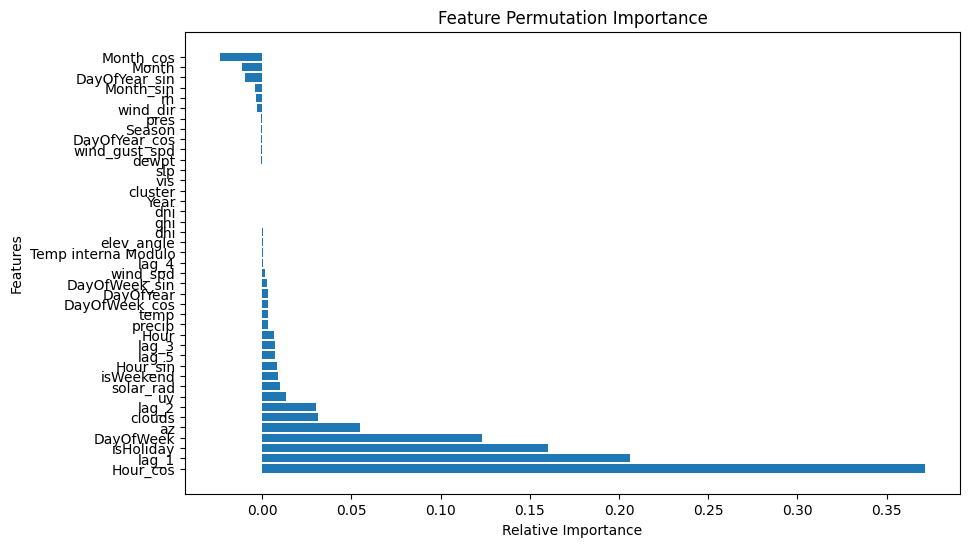

In [ ]:
from random import shuffle
def permutation_feature_importance(model, X_test, y_test, feature_names):
    y_pred = model.predict(X_test)
    y_pred = quantile_transformer.inverse_transform(y_pred.reshape(-1, 1)).flatten()

    #rmse_ref = root_mean_squared_error(y_test.flatten(), y_pred.flatten())
    mae_ref = mean_absolute_error(y_test, y_pred)

    feature_importance = np.zeros(X_test.shape[1])

    for i in tqdm(range(X_test.shape[1]), total=(X_test.shape[1])):
        #Make a Copy of the Test Subset and Permute its values
        X_test_permuted = X_test.copy()
        X_test_permuted[:, i] = shuffle(X_test_permuted[:, i])

        #Calculate the metrics
        y_pred_permuted = model.predict(X_test_permuted)
        y_pred_permuted = quantile_transformer.inverse_transform(y_pred_permuted.reshape(-1, 1)).flatten()

        #rmse_permuted = root_mean_squared_error(y_test.flatten(), y_pred_permuted.flatten())
        mae_permuted = mean_absolute_error(y_test, y_pred_permuted)

        #Calculate the difference in the metrics
        feature_importance[i] = mae_ref - mae_permuted
    
    #Normalize feature importances
    feature_importance /= feature_importance.sum()

    #Sort indexes
    sorted_indexes = feature_importance.argsort()[::-1]
    sorted_importances = feature_importance[sorted_indexes]
    sorted_importances_names = feature_names[sorted_indexes]

    #Bar Plot
    plt.figure(figsize=(10, 6))
    plt.barh(range(len(sorted_importances)), sorted_importances, align='center')
    plt.yticks(range(len(sorted_importances)), sorted_importances_names)
    plt.xlabel('Relative Importance')
    plt.ylabel('Features')
    plt.title('Feature Permutation Importance')
    plt.show()
permutation_feature_importance(regressorXGBR, X_test.to_numpy(), y_test.to_numpy(), np.array(col_names))